# Test the hologram performances with HD205905 data 8 jun 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : October 2nd th 2017
- update : October 6th 2017


The goal of this notebook is to find the parameters that optimize the1-D spectrum for the 2-D image of the disperse
spectrum.
In particular the width around the dispersion axis is very important. This width may bias the computation of equavalent width.
Moreover, we check in this notebook that the wavelength calibration make sense, ie, the position of the order 0 central star in the original image is correct, allowing wavelength calibration





#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 Ana2DShapeSpectra.ipynb

So it behaves better

In [7]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [62]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Ana2DShapeSpectra
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/ana_08jun17/HD205905


In [9]:
from astropy.modeling import models, fitting

In [10]:
import pandas as pd

# Input directory

In [11]:
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=144
MAX_IMGNUMBER=357
date="20170608"
object_name='HD205905'
tag = "rotimg"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

# Output directory

In [12]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

# Open files
===================================

## order 0 position in original image

In [13]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [14]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [15]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.244780,810.867649,636.809005
1,1,-1.060674,813.171528,634.613480
2,2,-1.996462,902.230030,574.581744
3,3,-1.712442,903.444644,575.474133
4,4,-1.414339,902.640341,574.293659


## order 0 position in rotated and cut image

In [16]:
df2=pd.read_csv('x_y_guess2.csv')
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]
order0_positions2 = np.array([x_star2,y_star2]).T

In [17]:
df2.head()

,Unnamed: 0,theta,x_guess2,y_guess2
0,0,-0.244780,811.359257,104.402556
1,1,-1.060674,814.676629,115.723779
2,2,-1.996462,905.337721,131.870591
3,3,-1.712442,906.069793,127.413465
4,4,-1.414339,904.657796,122.312519


## Input image files

- rotated and cut images

In [18]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)
print all_images[0].shape

Number of images: 53
(100, 2048)


In [19]:
print all_filt

['RG715 Ron200', 'RG715 HoloPhP', 'FGB37 HoloPhAg', 'RG715 HoloPhAg', 'FGB37 HoloAmAg', 'RG715 Ron200', 'RG715 Thor300', 'RG715 HoloAmAg', 'FGB37 Thor300', 'RG715 HoloAmAg', 'RG715 Ron200', 'RG715 HoloPhP', 'FGB37 HoloPhAg', 'RG715 HoloAmAg', 'FGB37 Thor300', 'RG715 Thor300', 'FGB37 HoloPhP', 'RG715 HoloPhP', 'RG715 HoloAmAg', 'RG715 Ron200', 'RG715 HoloPhAg', 'FGB37 Thor300', 'RG715 HoloPhAg', 'FGB37 HoloAmAg', 'FGB37 Ron200', 'FGB37 Thor300', 'RG715 Thor300', 'RG715 HoloPhAg', 'FGB37 Ron200', 'FGB37 Thor300', 'FGB37 HoloPhP', 'FGB37 HoloAmAg', 'RG715 HoloAmAg', 'FGB37 Ron200', 'RG715 Ron200', 'FGB37 Thor300', 'RG715 HoloAmAg', 'FGB37 Thor300', 'RG715 HoloPhP', 'FGB37 Thor300', 'RG715 Thor300', 'FGB37 HoloPhP', 'FGB37 HoloAmAg', 'FGB37 HoloPhP', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'FGB37 HoloAmAg', 'RG715 HoloAmAg', 'RG715 Thor300', 'FGB37 Thor300', 'FGB37 Thor300', 'FGB37 HoloPhP', 'RG715 Thor300']


## Check calib info on holograms and disperser

In [63]:
all_grat = []
all_holo = []
for f in all_filt :
    #all_grat.append(f.replace('RG715 ',''))
    #all_grat.append(f.replace('dia ',''))
    disp=get_disperser_filtname(f)
    all_grat.append(disp)
for index,g in enumerate(all_grat):
    holo = Hologram(g,verbose=False)
    #all_holo.append[holo]
    print 'holo_name=',g,'holo_theta=',holo.theta(order0_positions[index]),' rot_theta',all_theta[index],'order0_positions', order0_positions[index]

holo_name= HoloRon400 holo_theta= 0  rot_theta -0.24478039603 order0_positions [ 810.8676494   636.80900497]
holo_name= HoloPhP holo_theta= [-1.01476022]  rot_theta -1.06067369412 order0_positions [ 813.17152758  634.61347974]
holo_name= HoloPhAg holo_theta= [-1.92334497]  rot_theta -1.99646196184 order0_positions [ 902.23003002  574.5817443 ]
holo_name= HoloPhAg holo_theta= [-1.92192208]  rot_theta -1.71244246318 order0_positions [ 903.44464448  575.47413259]
holo_name= HoloAmAg holo_theta= [-1.9489722]  rot_theta -1.41433908664 order0_positions [ 902.64034101  574.29365933]
holo_name= HoloRon400 holo_theta= 0  rot_theta -0.353177055999 order0_positions [ 813.9289985   632.97842093]
holo_name= Thor300 holo_theta= -0.575  rot_theta -0.426884605927 order0_positions [ 813.9866739   634.20262756]
holo_name= HoloAmAg holo_theta= [-1.95245117]  rot_theta -1.28231128768 order0_positions [ 901.9347114   572.76297826]
holo_name= Thor300 holo_theta= -0.575  rot_theta -0.4869445424 order0_positi

## Show filters and dispersers

In [21]:
Filt_names

['dia Ron400',
 'dia Thor300',
 'dia HoloPhP',
 'dia HoloPhAg',
 'dia HoloAmAg',
 'dia Ron200',
 'Unknown']

In [22]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [23]:
print Filt_names[0],filt0_idx
print Filt_names[1],filt1_idx
print Filt_names[2],filt2_idx
print Filt_names[3],filt3_idx
print Filt_names[4],filt4_idx
print Filt_names[5],filt5_idx
print Filt_names[6],filt6_idx

dia Ron400 []
dia Thor300 [ 6  8 14 15 21 25 26 29 35 37 39 40 48 49 50 52]
dia HoloPhP [ 1 11 16 17 30 38 41 43 44 51]
dia HoloPhAg [ 2  3 12 20 22 27 45]
dia HoloAmAg [ 4  7  9 13 18 23 31 32 36 42 46 47]
dia Ron200 [ 0  5 10 19 24 28 33 34]
Unknown []


# Input images


Notice, we expect the spectrum is centered in vertical.
The central star is at the origin in the raw image

## Full rotated image

In [24]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


## Center of central star

Obviously the previous estimation of the center is wrong

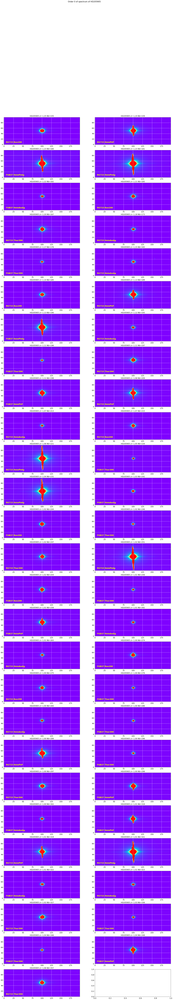

In [25]:
# Center : Order 0
#-------------------
# start at star
y_star0=[all_images[0].shape[0]/2]*len(all_images)
x_star0=x_star2
#ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
#                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0,y_star0,[100]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

title='Order 0 of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'order0.pdf')
plt.savefig(figfilename)  

### check weighted_avg_and_std is a good estimator of the central position

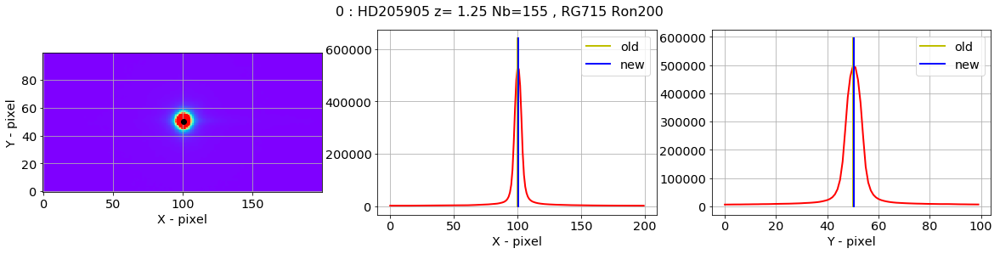

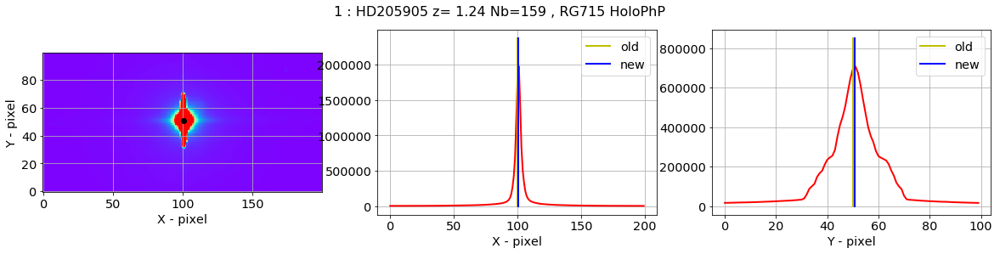

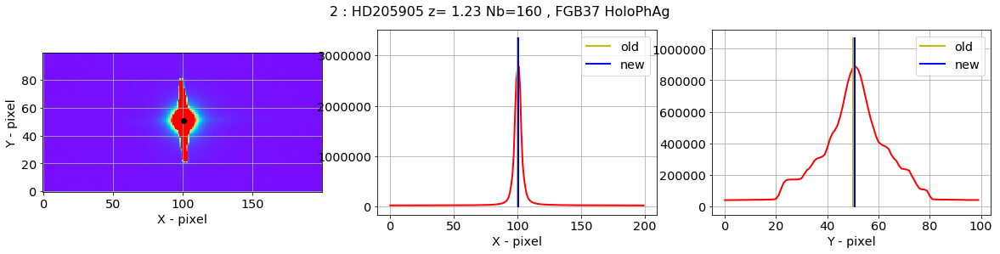

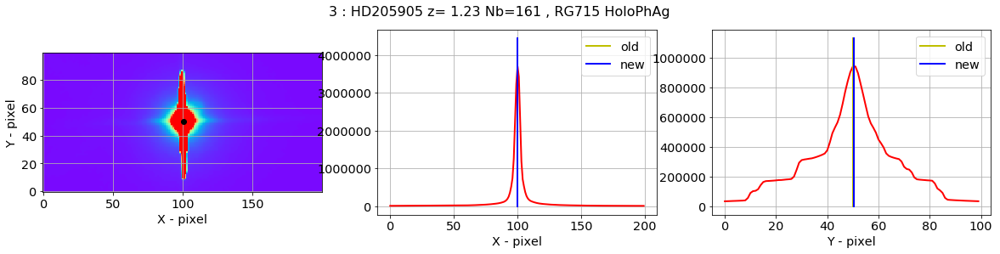

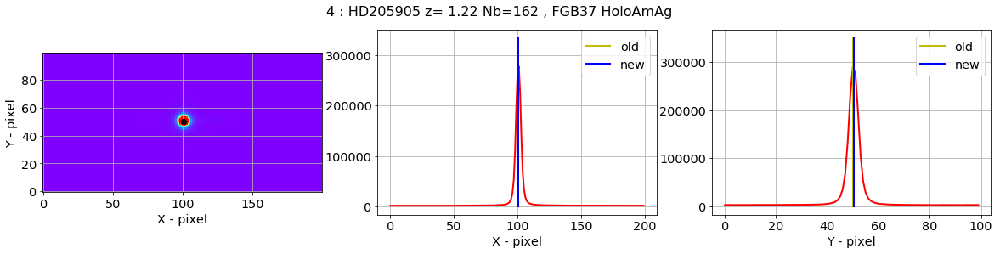

...

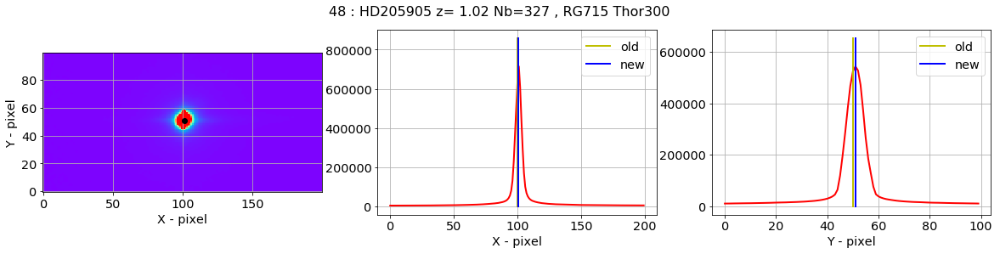

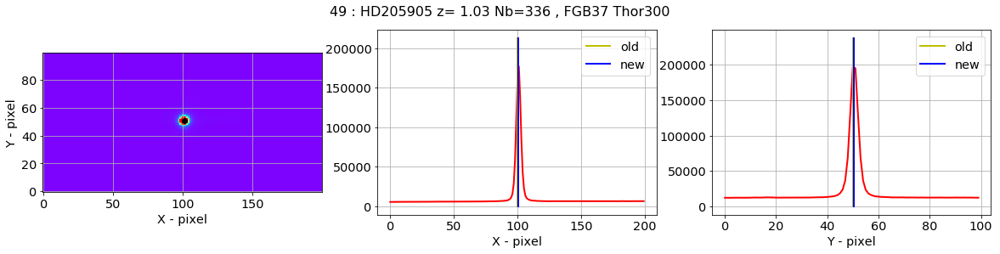

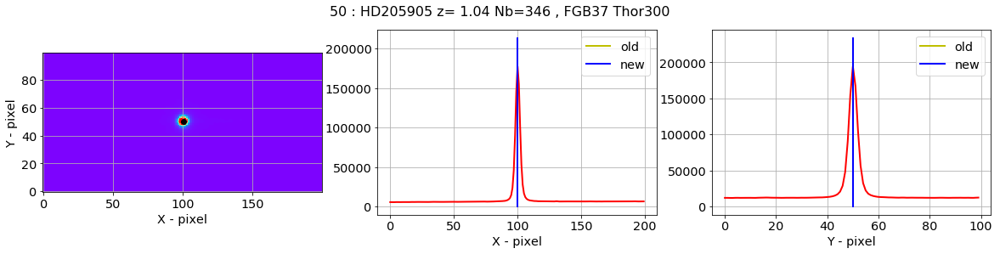

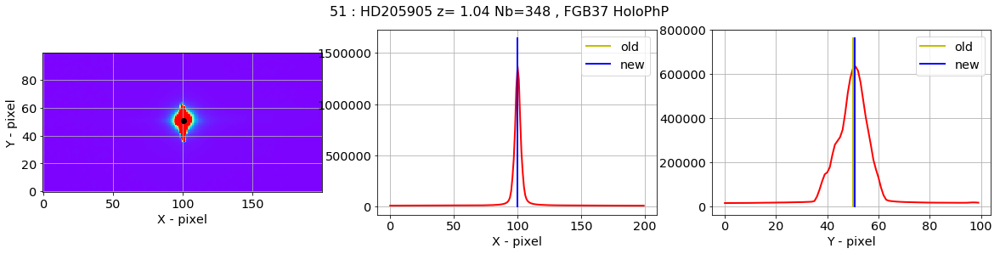

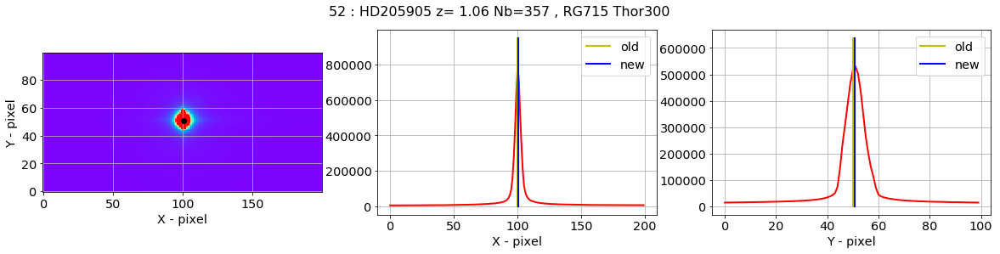

In [61]:
new_x_star,new_y_star=check_central_star(all_images,x_star2,y_star0,all_titles,all_filt)

## Zoom on the rotated image

In [27]:
# Right spectrum
#---------------
# start at star
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star

y_star0=new_y_star
x_star0=new_x_star
#ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
#                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0+400,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([new_x_star,new_y_star]).T)

title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


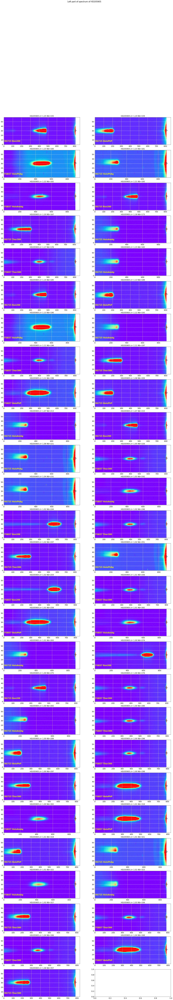

In [28]:
# Left spectrum
#--------------
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star-600

y_star0=new_y_star
x_star0=new_x_star

#ShowCenterImages([110]*len(all_images),[60]*len(all_images),[500]*len(all_images),[30]*len(all_images),
#                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0-600,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([new_x_star,new_y_star]).T)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  


# Main emission/absorption lines in nm


In [29]:
for line in LINES:
    print line['label'],' \t lambda =' ,line['lambda']

$H\delta$  	 lambda = 410.2
$H\gamma$  	 lambda = 434.0
$He_{II}$  	 lambda = 468.6
$H\beta$  	 lambda = 486.3
$O_{III}$  	 lambda = 500.7
$C_{III}$  	 lambda = 570.0
$He_{I}$  	 lambda = 587.5
$H\alpha$  	 lambda = 656.3
$C_{III}$  	 lambda = 673.0
$C_{II}$  	 lambda = 679.0
$C_{IV}$  	 lambda = 706.0
$C_{II}$  	 lambda = 711.0
$C_{II}$  	 lambda = 723.5
$O_2$  	 lambda = 762.1
$H_2 O$  	 lambda = 960


# Plot one contour

Load hologram RG715 Ron200:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


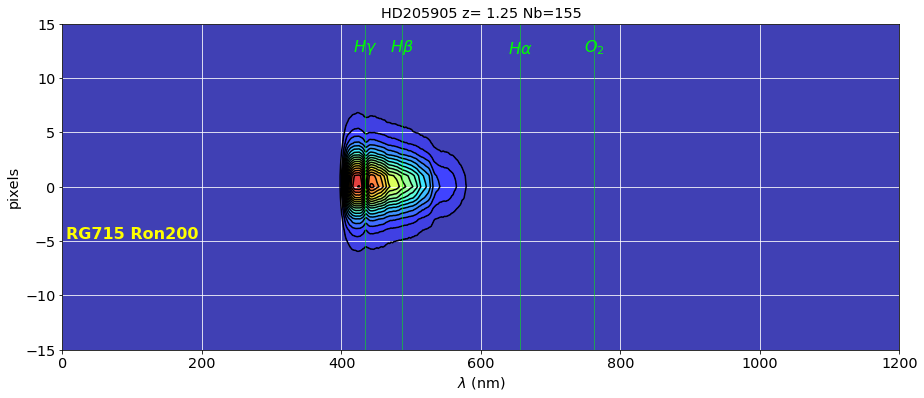

In [30]:
sel=0
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_ron400_1.pdf')

Load hologram RG715 HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


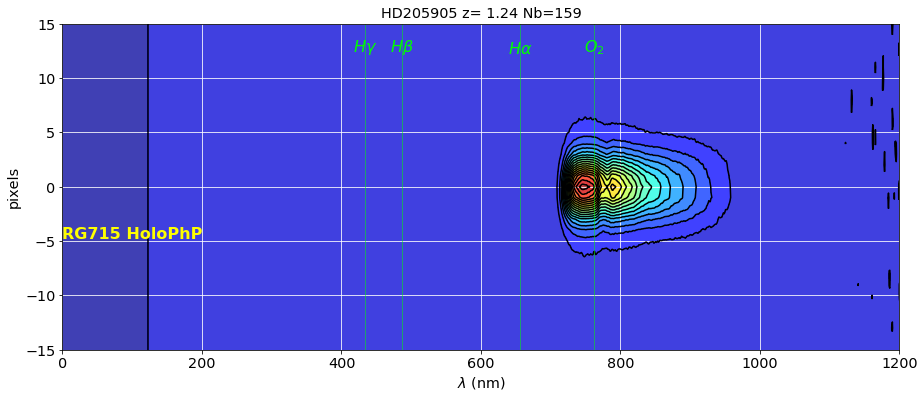

In [31]:
sel=1
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_thor300_1.pdf')

Load hologram FGB37 HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


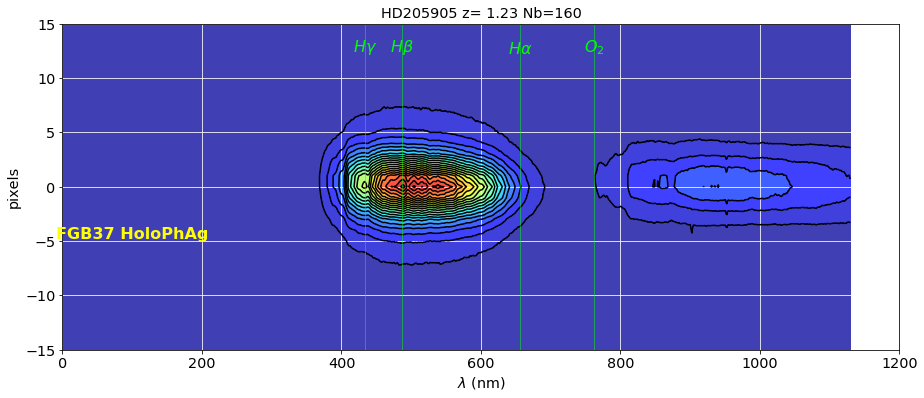

In [32]:
sel=2
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_holophp_1.pdf')

Load hologram RG715 HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


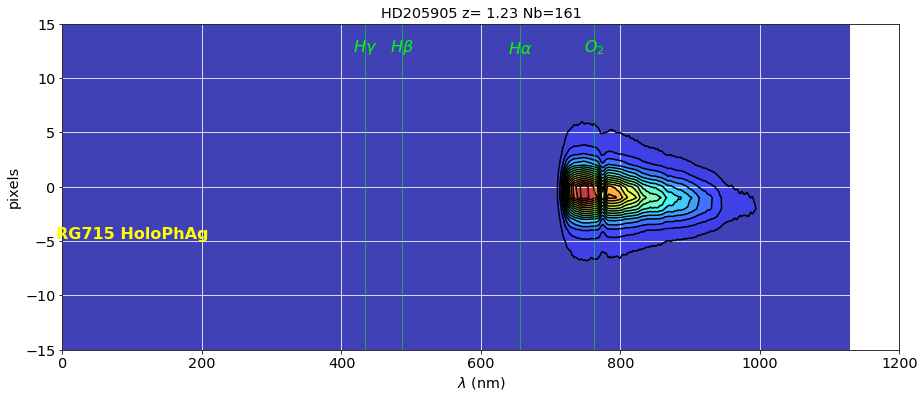

In [33]:
sel=3
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_holophag_1.pdf')

Load hologram FGB37 HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


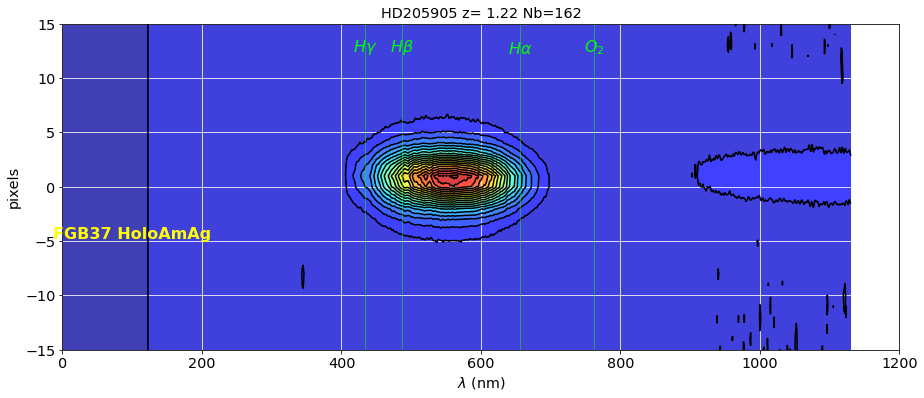

In [34]:
sel=4
ShowOneContour(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'contour_holoamag_1.pdf')

pdf Page written  1


/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


pdf Page written  2
pdf Page written  3
pdf Page written  4
pdf Page written  5
Final pdf Page written  5


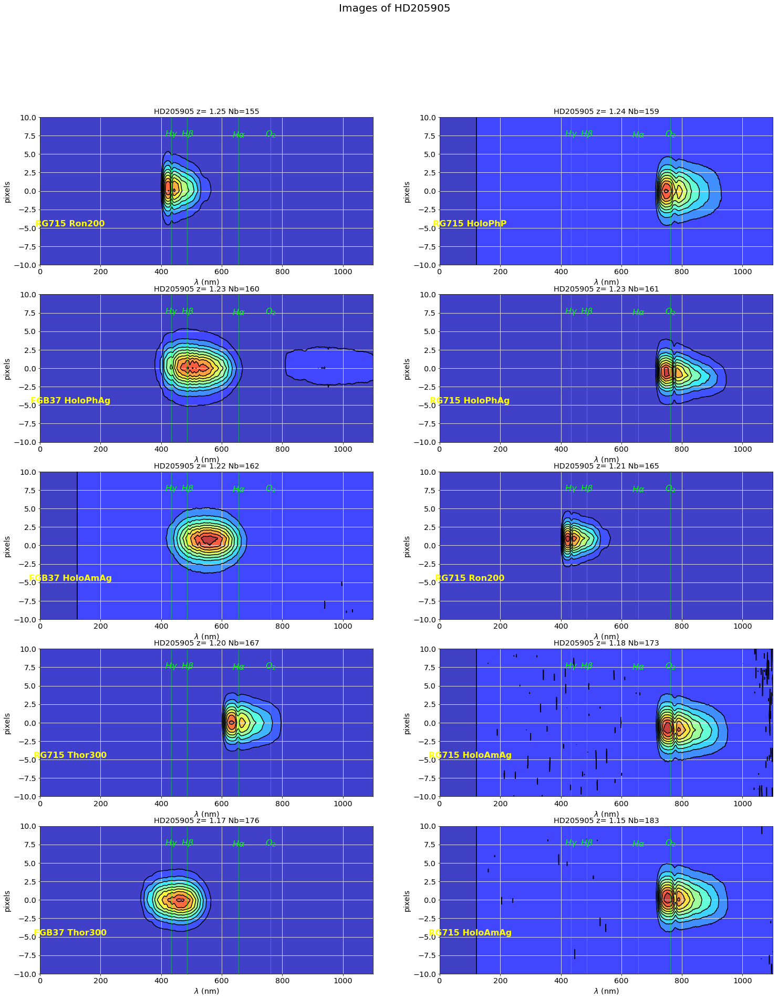

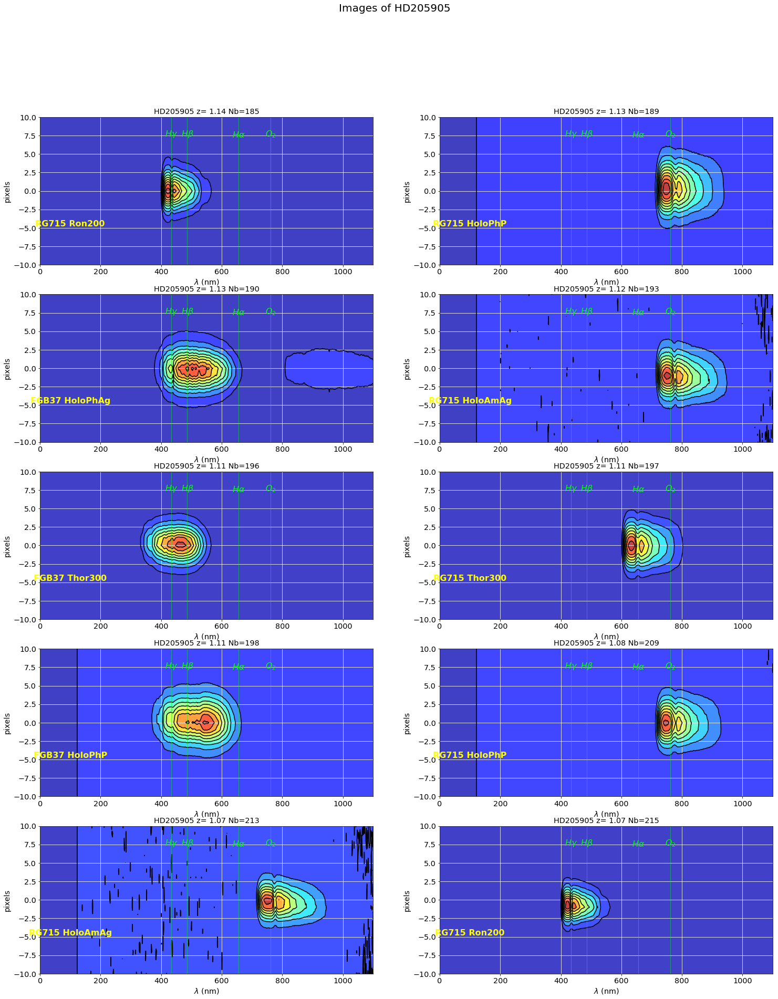

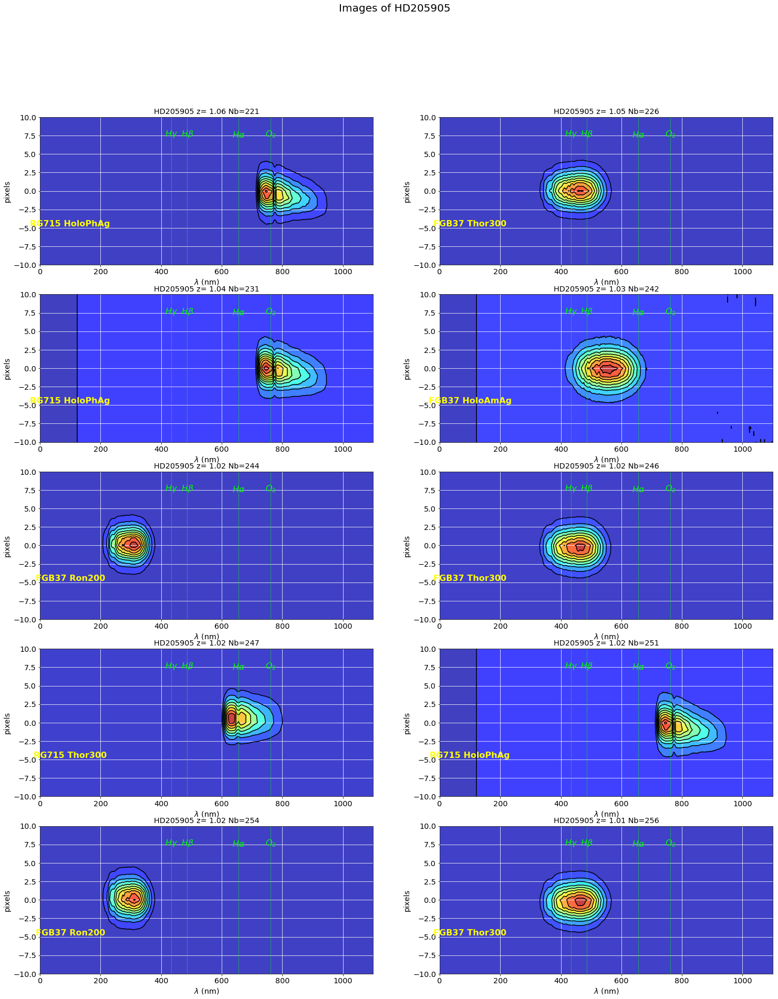

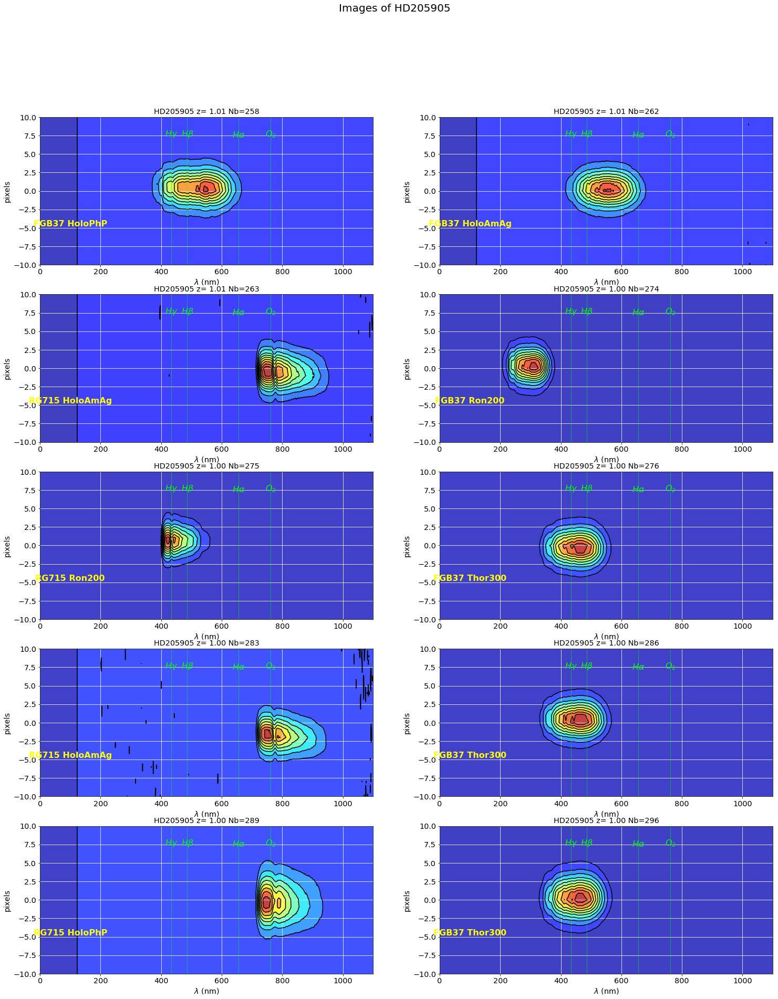

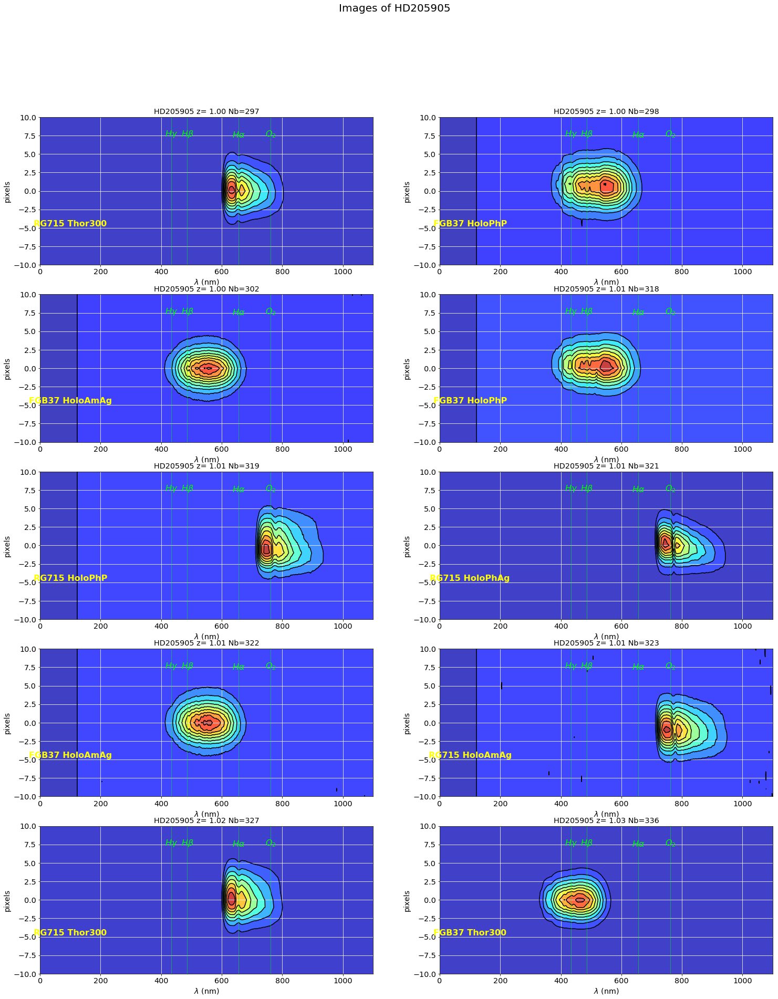

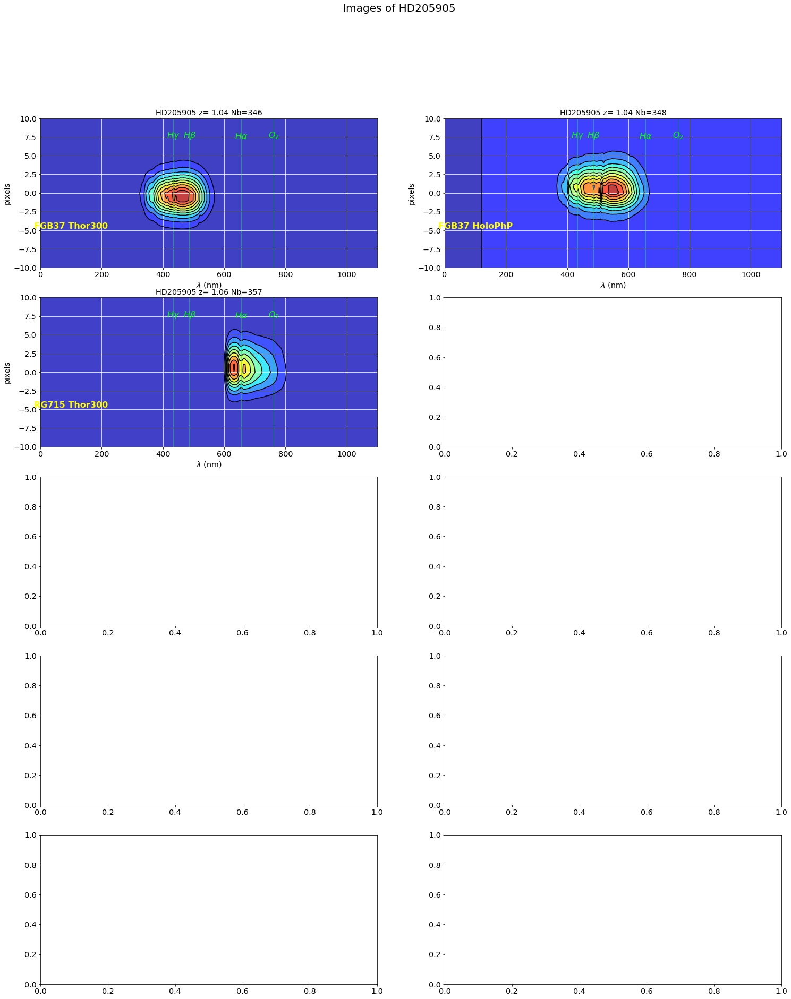

In [35]:
ShowOneOrder_contour(all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour.pdf')

## Test which transverse spectrum

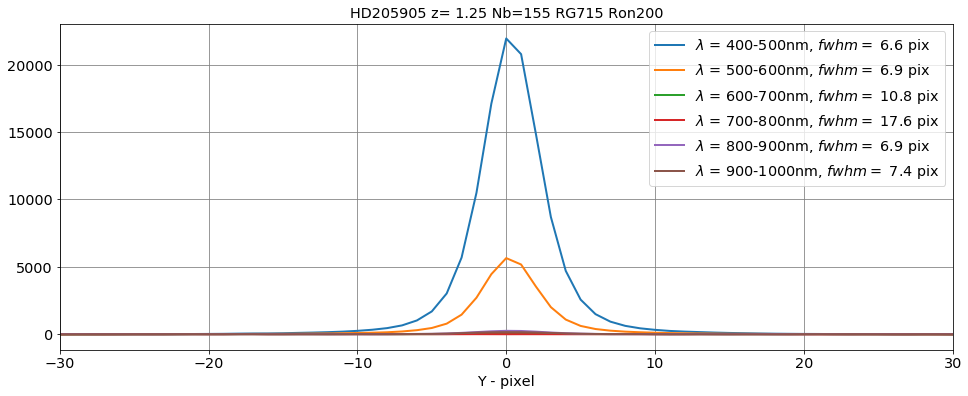

In [36]:
sel=0
w0,fwhm0=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_thor300.pdf')

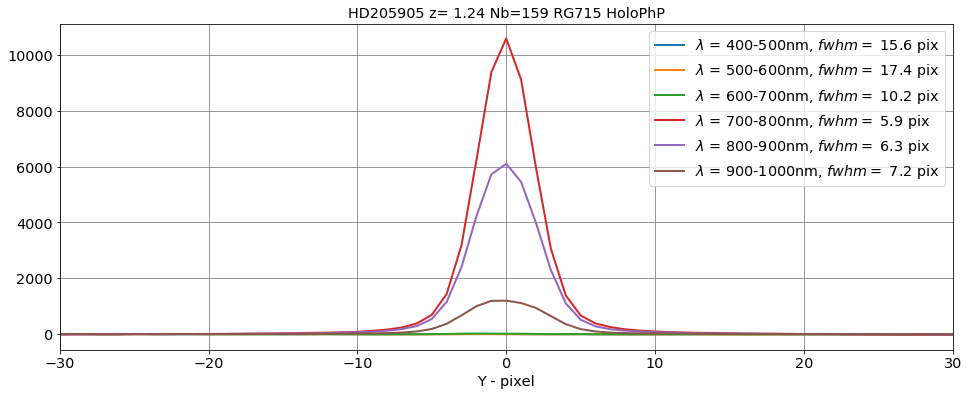

In [37]:
sel=1
w2,fwhm2=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_holophp.pdf')

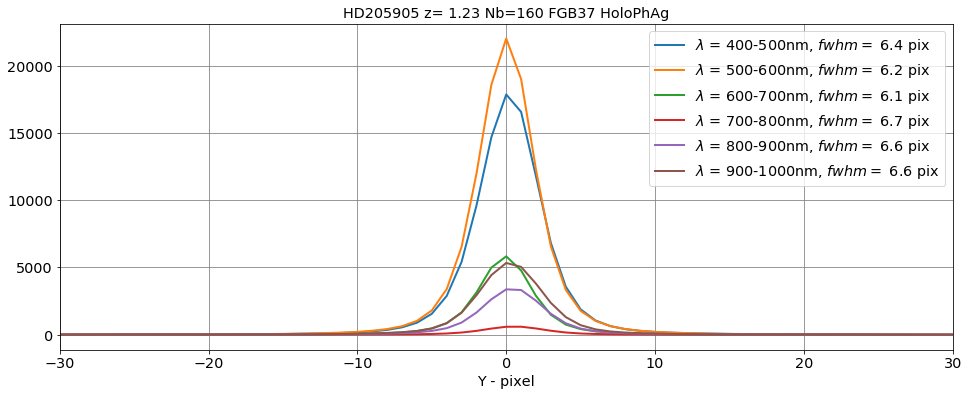

In [38]:
sel=2
w3,fwhm3=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_holophag.pdf')

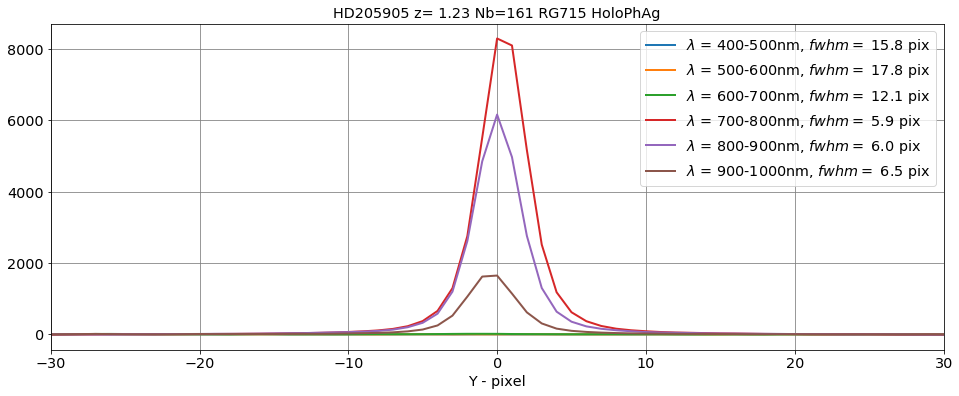

In [39]:
sel=3
w4,fwhm4=ShowManyTransverseSpectrum(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'transverse_holoamag.pdf')

## Summary on fwhm 

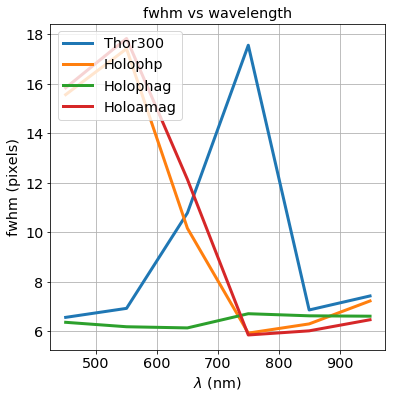

In [40]:
plt.figure(figsize=(6,6))
NBINS=w0.shape[0]
plt.plot(w0,fwhm0,'-',label='Thor300',lw=3)
#plt.plot(w1,fwhm1,'-',label='Ron400',lw=3)
plt.plot(w2,fwhm2,'-',label='Holophp',lw=3)
plt.plot(w3,fwhm3,'-',label='Holophag',lw=3)
plt.plot(w4,fwhm4,'-',label='Holoamag',lw=3)
plt.grid()
plt.xlabel('$\lambda$ (nm)')
plt.ylabel('fwhm (pixels)')
plt.title('fwhm vs wavelength')
plt.legend(loc=2)
figname='fwhm_vs_lambdas_{}.pdf'.format(NBINS)
figfilename=os.path.join(dir_top_images,figname)  
#plt.ylim(0.,25.)
plt.savefig(figfilename)

## Longitudinal spectrum versus transverse width

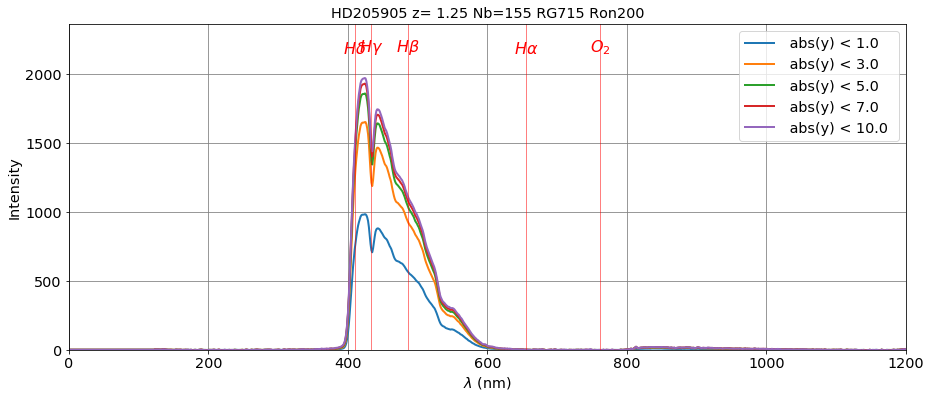

In [41]:
sel=0
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_thor300_1.pdf')

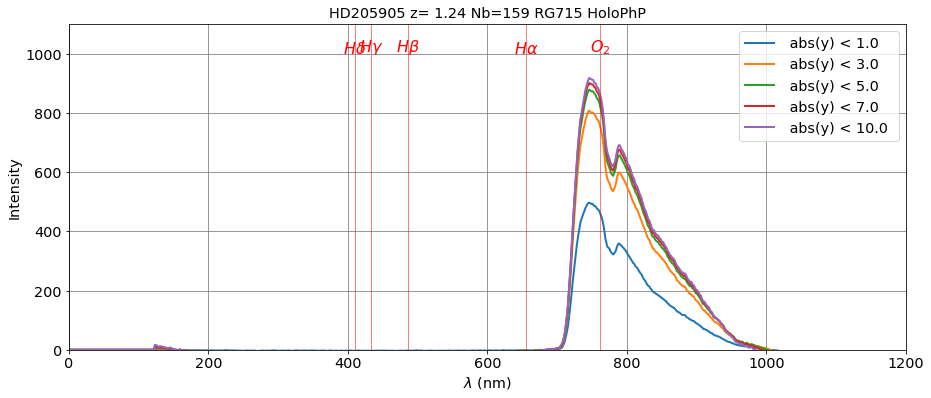

In [42]:
sel=1
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_holophp_1.pdf')

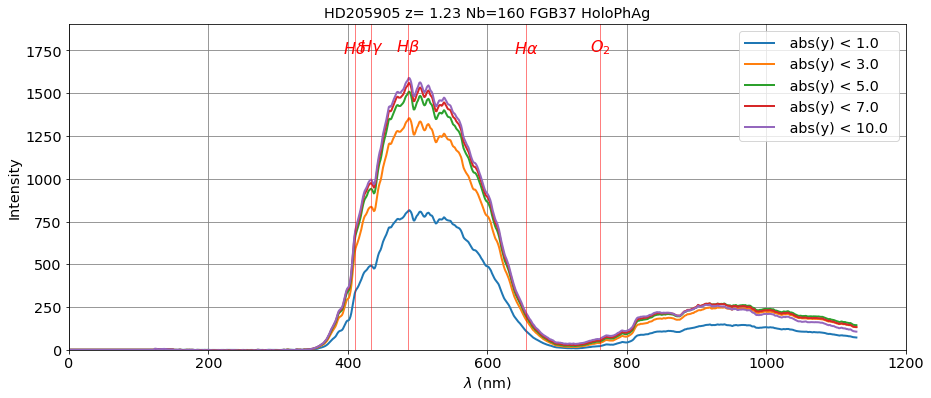

In [43]:
sel=2
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_holophag_1.pdf')

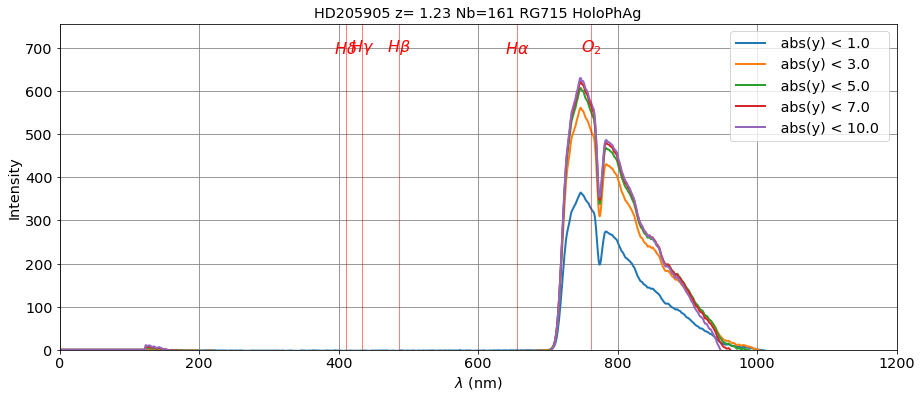

In [44]:
sel=3
ShowLongitudinalSpectraSelection(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_holoamag_1.pdf')

## Quality of O2

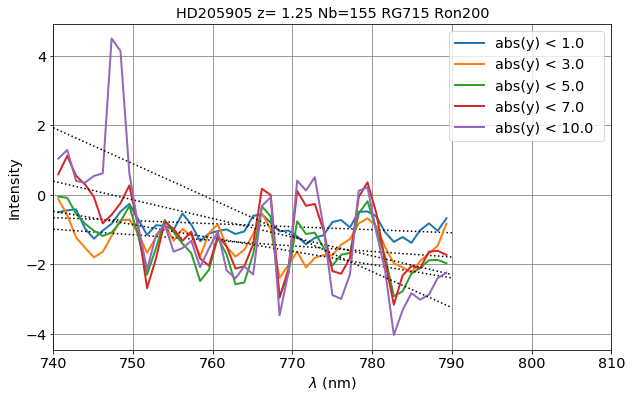

In [45]:
sel=0
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_thor300.pdf')

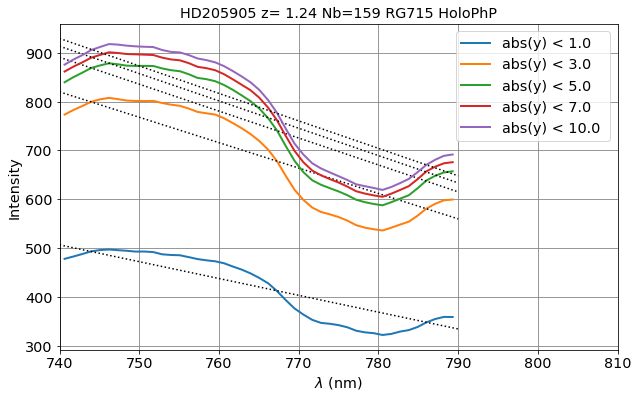

In [46]:
sel=1
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holophag.pdf')

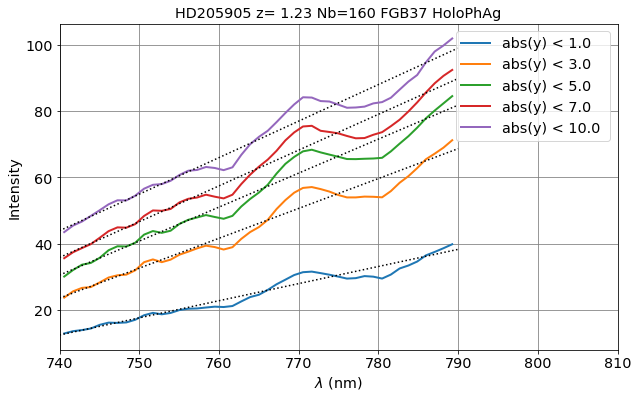

In [47]:
sel=2
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holophag.pdf')

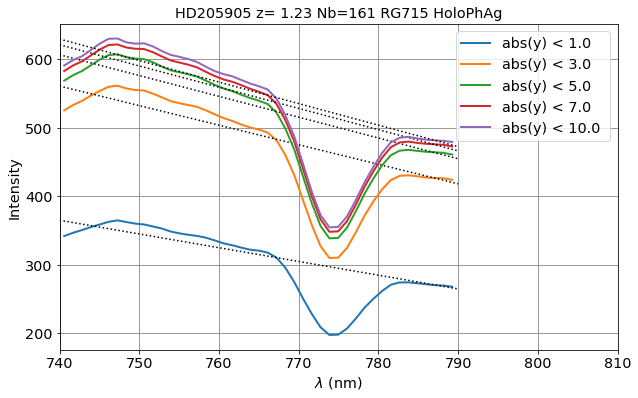

In [48]:
sel=3
ShowOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_o2absline_holoamag.pdf')

# Equivalent width

Load hologram RG715 Ron200:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


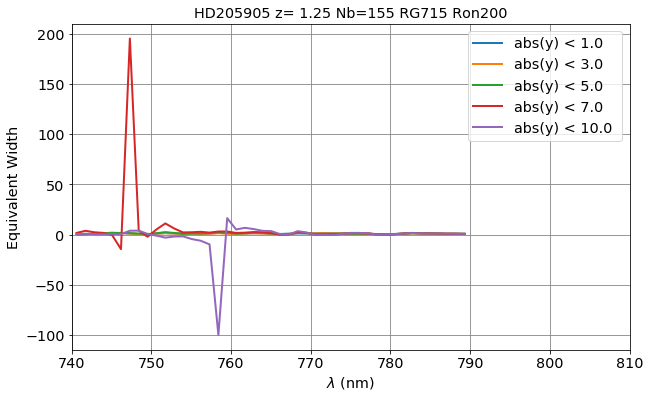

In [49]:
sel=0
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_thor300_1.pdf')

Load hologram RG715 HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


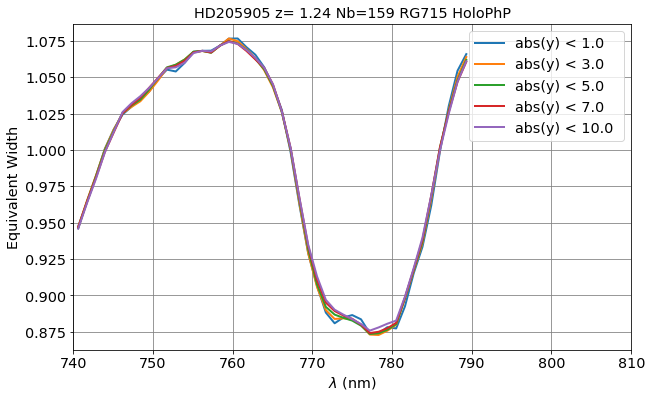

In [50]:
sel=1
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_holophp.pdf')

Load hologram FGB37 HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


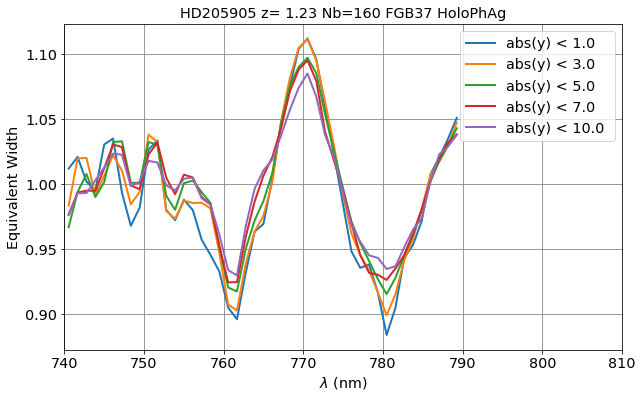

In [51]:
sel=2
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_holophag.pdf')

Load hologram RG715 HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


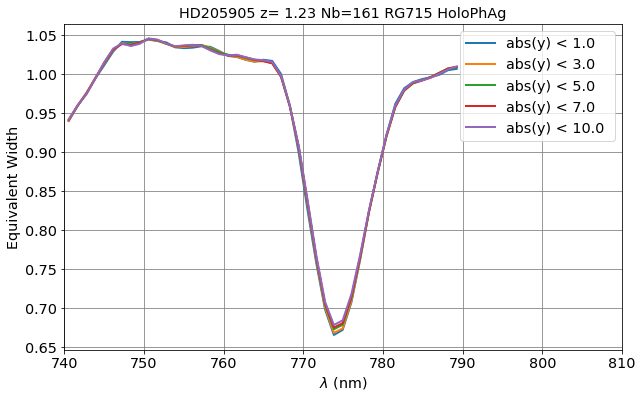

In [52]:
sel=3
ShowOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'long_eqwwidth_holoamag.pdf')

# Compute equivalent width and show absorption line

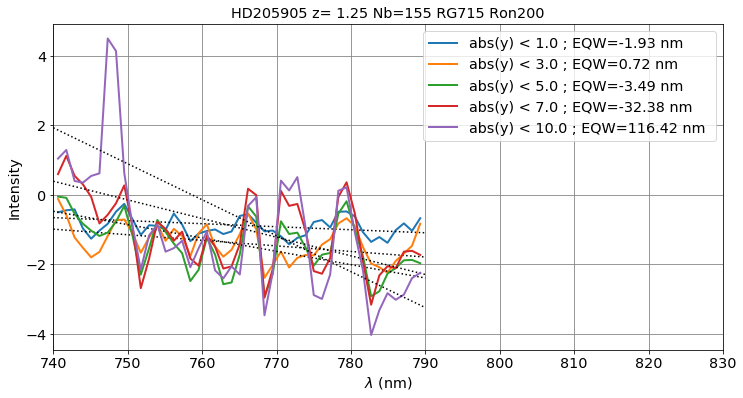

In [53]:
sel=0
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_thor300_1.pdf')

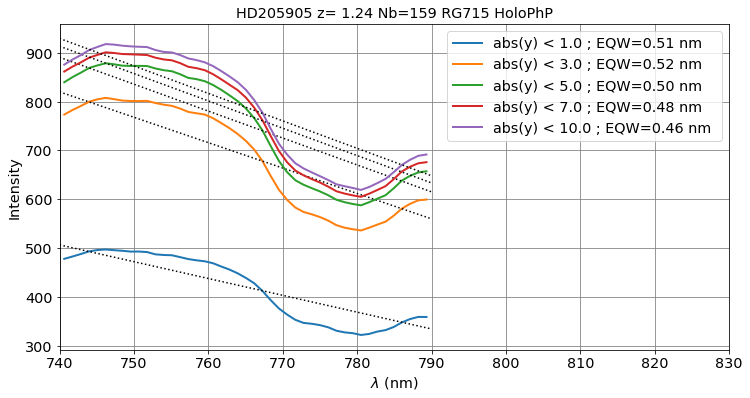

In [54]:
sel=1
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_php_1.pdf')

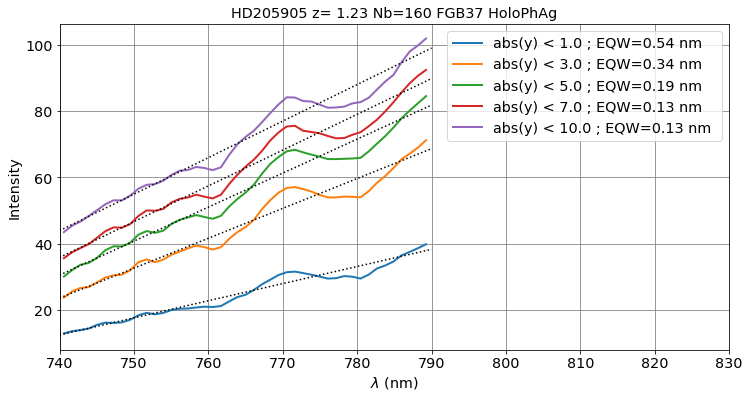

In [55]:
sel=2
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_phag_1.pdf')

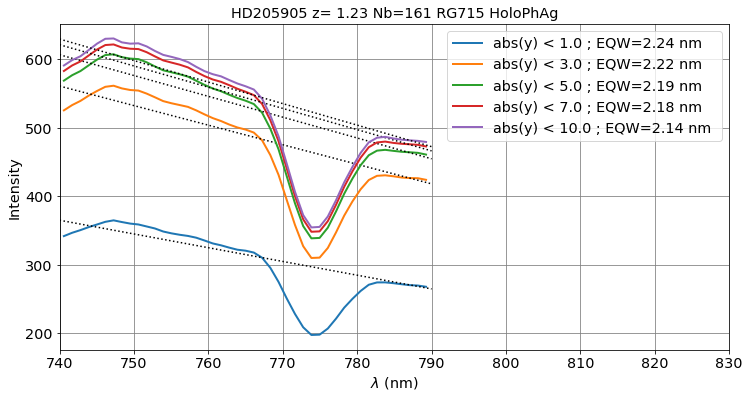

In [56]:
sel=3
CalculateOneAbsorptionLine(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_amag_1.pdf')

# Computation of equivalent width and show equivalent width

Load hologram RG715 Ron200:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


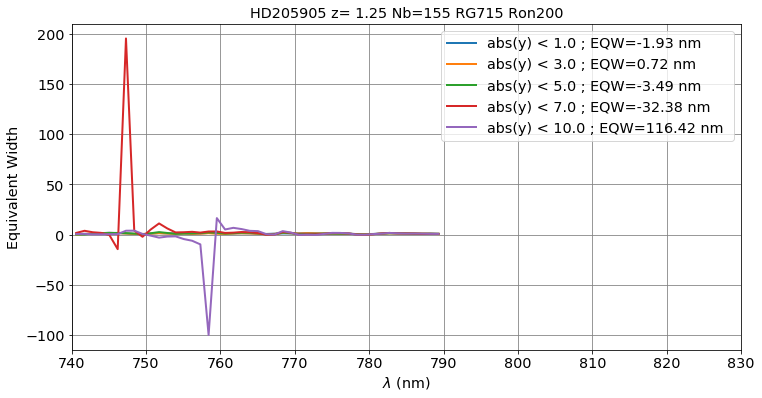

In [57]:
sel=0
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_thor300_1.pdf')

Load hologram RG715 HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


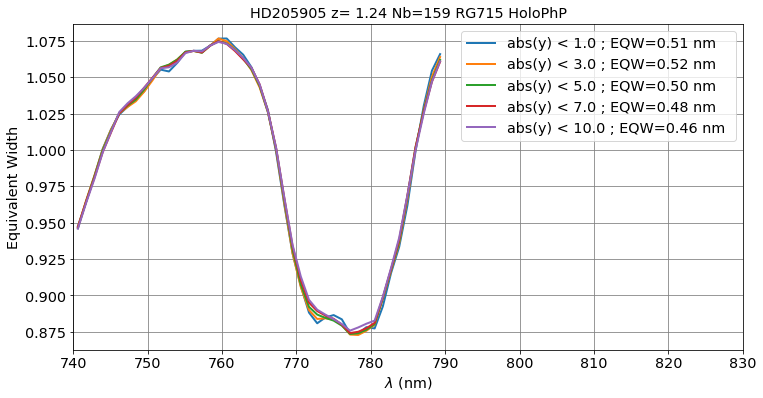

In [58]:
sel=1
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_holophp_1.pdf')

Load hologram FGB37 HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


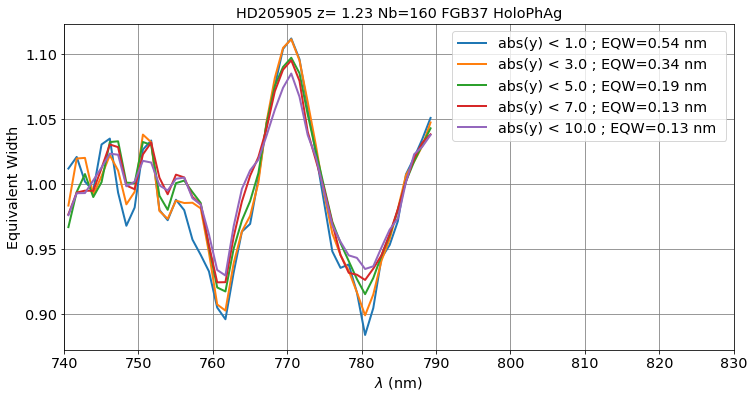

In [59]:
sel=2
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_holophag_1.pdf')

Load hologram RG715 HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of 0.0 degrees
Hologram center at x0 = 1024.0 and y0 = 1024.0 with average tilt of 0.0 degrees
Order  0 position at x0 = 759.0 and y0 = 1024.0
Order +1 position at x0 = 1289.0 and y0 = 1024.0
Distance between the orders: 530.06 pixels (12.72 mm)


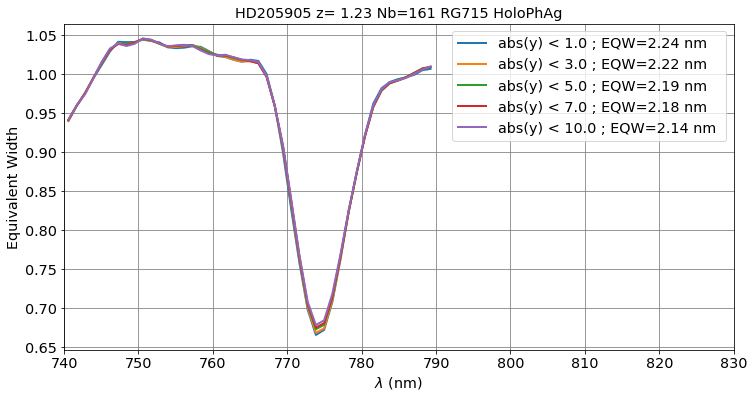

In [60]:
sel=3
CalculateOneEquivWidth(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'calc_eqwwidth_holoamag_1.pdf')